In [96]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

## histogram:

In [97]:
body   = cv2.imread("body.jpg")
body = cv2.cvtColor(body, cv2.COLOR_BGR2RGB)

summer = cv2.imread("summer.jpg")
summer = cv2.cvtColor(summer , cv2.COLOR_BGR2RGB)

spring = cv2.imread("spring.jpg")
spring = cv2.cvtColor(spring , cv2.COLOR_BGR2RGB)

blur = cv2.imread("blur.jpg")
blur = cv2.cvtColor(blur , cv2.COLOR_BGR2RGB)

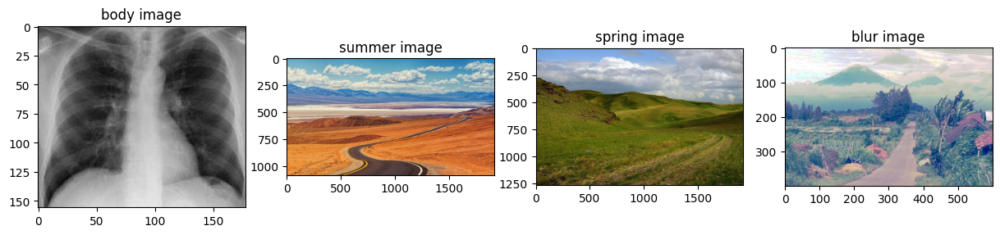

In [98]:
fig, axs = plt.subplots(1, 4, figsize=(15, 5))

axs[0].imshow(body)
axs[0].set_title('body image')

axs[1].imshow(summer)
axs[1].set_title('summer image')

axs[2].imshow(spring)
axs[2].set_title('spring image')

axs[3].imshow(blur)
axs[3].set_title('blur image')

plt.show()

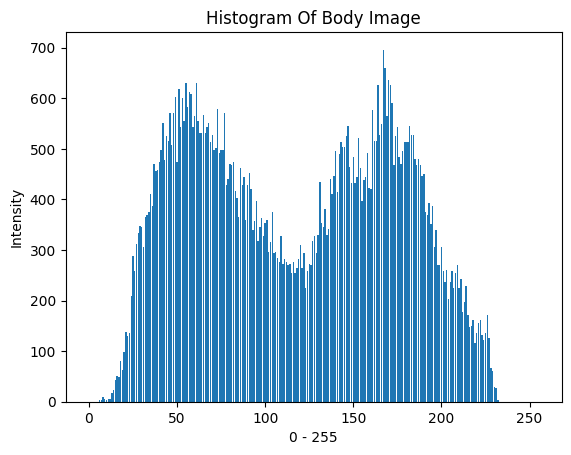

In [99]:
count = np.zeros(256)

for b in body:
	for i in range(len(b)):
		for j in range(len(b[i])):
			 count[b[i][j] - 1] += 1

plt.bar(np.arange(256), count)
plt.xlabel('0 - 255')
plt.ylabel('Intensity')
plt.title('Histogram Of Body Image')
plt.show()

In [100]:
def histogram_rgb_image(image):
	
	count_R = np.zeros(256)
	count_G = np.zeros(256)
	count_B = np.zeros(256)
	
	R = image[:, :, 0]
	G = image[:, :, 1]
	B = image[:, :, 2]
	
	for pixel in R.flatten():
		count_R[pixel] += 1
	for pixel in G.flatten():
		count_G[pixel] += 1
	for pixel in B.flatten():
		count_B[pixel] += 1
					
	fig, axs = plt.subplots(1, 3, figsize=(15, 5))
	
	# Red channel
	axs[0].bar(np.arange(256), count_R, color='red')
	axs[0].set_xlabel('0 - 255')
	axs[0].set_ylabel('Intensity')
	axs[0].set_title('Histogram Red')

	# Green channel
	axs[1].bar(np.arange(256), count_G, color='green')
	axs[1].set_xlabel('0 - 255')
	axs[1].set_ylabel('Intensity')
	axs[1].set_title('Histogram Green')

	# Blue channel
	axs[2].bar(np.arange(256), count_B, color='blue')
	axs[2].set_xlabel('0 - 255')
	axs[2].set_ylabel('Intensity')
	axs[2].set_title('Histogram Blue')

	plt.tight_layout()
	
	plt.show()

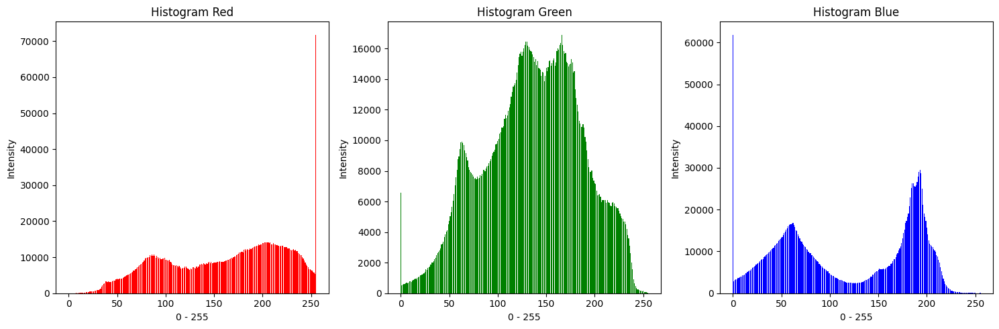

In [101]:
histogram_rgb_image(summer)

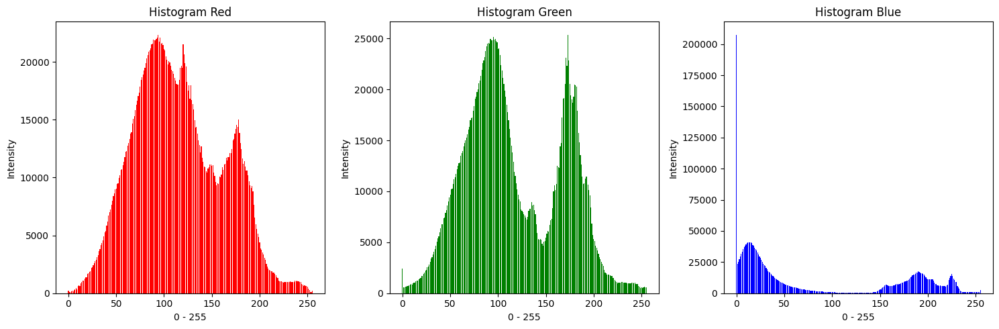

In [102]:
histogram_rgb_image(spring)

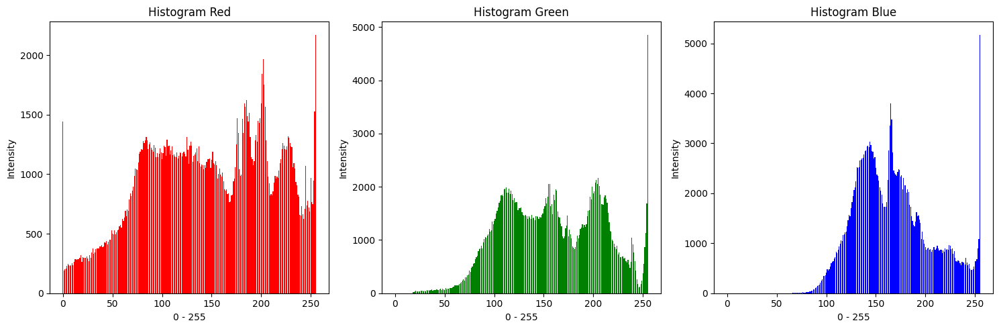

In [103]:
histogram_rgb_image(blur)

In [104]:
print("shape of body is",body.shape)
print("shape of summer is",summer.shape)
print("shape of spring is",spring.shape)
print("shape of blur is",blur.shape)
print('\n')

resized_body   = cv2.resize(body, (256, 256))
resized_summer = cv2.resize(summer, (256, 256))
resized_spring = cv2.resize(spring, (256, 256))
resized_blur   = cv2.resize(blur, (256, 256))

print("shape of body after resize",resized_body.shape)
print("shape of summer after resize",resized_summer.shape)
print("shape of spring after resize",resized_spring.shape)
print("shape of blur after resize",resized_blur.shape)

shape of body is (156, 178, 3)
shape of summer is (1080, 1920, 3)
shape of spring is (1267, 1920, 3)
shape of blur is (400, 600, 3)


shape of body after resize (256, 256, 3)
shape of summer after resize (256, 256, 3)
shape of spring after resize (256, 256, 3)
shape of blur after resize (256, 256, 3)


## histogram matching:

In [105]:
def calculate_histogram(image):
	# Initialize histogram arrays for each channel
	hist_r = np.zeros(256, dtype=int)
	hist_g = np.zeros(256, dtype=int)
	hist_b = np.zeros(256, dtype=int)

	# Iterate over each pixel in the image
	for row in range(image.shape[0]):
		for col in range(image.shape[1]):
			# Get the RGB values of the pixel
			r, g, b = image[row, col]

			# Increment the corresponding histogram bins
			hist_r[r] += 1
			hist_g[g] += 1
			hist_b[b] += 1

	return [hist_r, hist_g, hist_b]

In [106]:
hist_summer = calculate_histogram(resized_summer)
hist_spring = calculate_histogram(resized_spring)

In [109]:
def calculate_pdf(all_hist):
	hist_r, hist_g, hist_b = all_hist
	
	pdf_r = hist_r / float(np.sum(hist_r))
	pdf_g = hist_g / float(np.sum(hist_g))
	pdf_b = hist_b / float(np.sum(hist_b))
	
	return [pdf_r, pdf_g, pdf_b]

In [166]:
pdf_summer = calculate_pdf(hist_summer)

In [111]:
def calculate_cdf(all_pdf):
	pdf_r, pdf_g, pdf_b = all_pdf
	
	cdf_r = np.cumsum(pdf_r)
	cdf_g = np.cumsum(pdf_g)
	cdf_b = np.cumsum(pdf_b)
	
	return [cdf_r, cdf_g, cdf_b]

In [167]:
cdf_summer = calculate_cdf(pdf_summer)

In [120]:
def histogram_matching(image, ref_hist):
	all_hist = calculate_histogram(image)
	all_cdf = calculate_cdf(all_hist)
	
	all_ref_cdf = calculate_cdf(ref_hist)

	# Perform histogram matching for each channel
	matched_image = np.zeros_like(image)
	for i in range(3):
		for intensity in range(256):
			idx = np.where(all_ref_cdf[i] >= all_cdf[i][intensity])[0]
			if len(idx) > 0:
				matched_image[:,:,i][image[:,:,i] == intensity] = idx[0]
			else:
				matched_image[:,:,i][image[:,:,i] == intensity] = 255  # Handle edge case
			
	return matched_image

In [121]:
reference_histogram = calculate_histogram(resized_spring)
matched_summer = histogram_matching(resized_summer, reference_histogram)
matched_summer

array([[[ 80, 164, 204],
        [ 79, 161, 199],
        [ 78, 159, 201],
        ...,
        [ 21,  96, 184],
        [ 19,  94, 190],
        [ 19,  94, 190]],

       [[ 81, 166, 208],
        [ 79, 161, 199],
        [ 79, 162, 206],
        ...,
        [ 21,  96, 184],
        [ 21,  97, 192],
        [ 23,  98, 194]],

       [[ 80, 164, 204],
        [ 80, 164, 204],
        [ 79, 162, 206],
        ...,
        [ 29, 100, 194],
        [ 25,  99, 190],
        [ 26, 100, 192]],

       ...,

       [[128,  88,   6],
        [157, 100,  12],
        [ 90,  37,   0],
        ...,
        [172, 105,  22],
        [188, 134,  28],
        [133,  89,  11]],

       [[240, 176,  29],
        [223, 173,  28],
        [114,  72,   1],
        ...,
        [185, 129,  25],
        [157,  96,  21],
        [153,  94,  12]],

       [[184, 152,  25],
        [187, 165,  27],
        [148,  95,  13],
        ...,
        [178, 103,  19],
        [170, 101,  19],
        [173, 103,  16]]

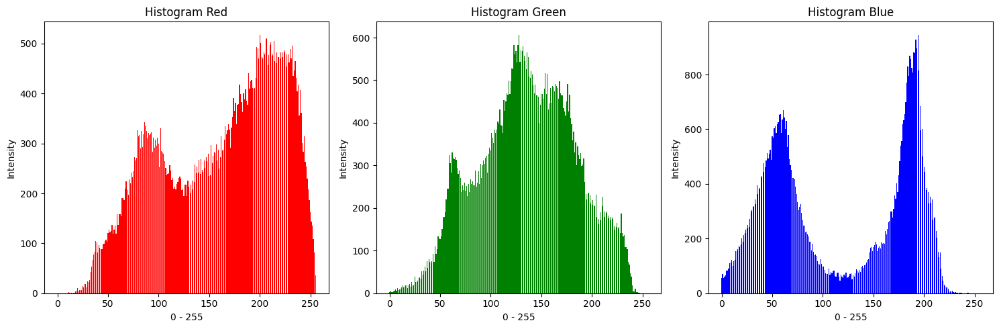

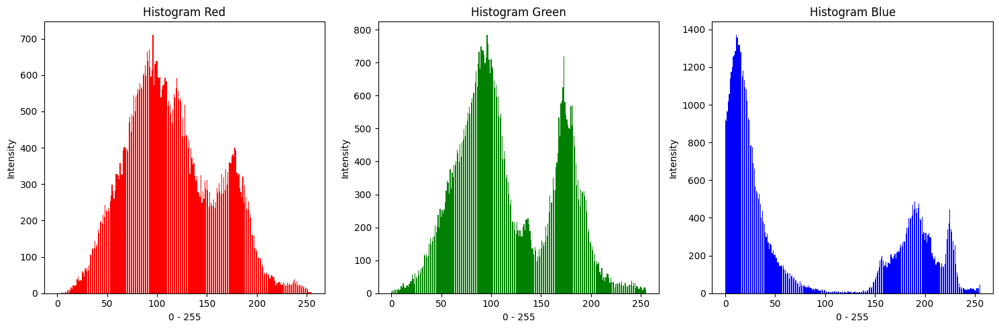

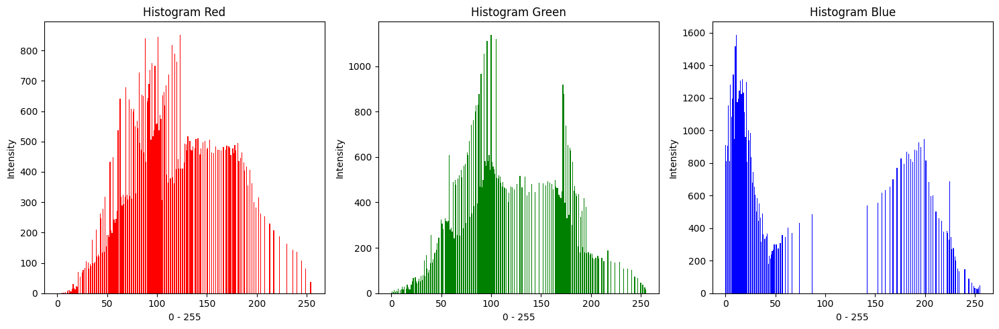

In [122]:
histogram_rgb_image(resized_summer)
histogram_rgb_image(resized_spring)
histogram_rgb_image(matched_summer)

Text(0.5, 1.0, 'matched image')

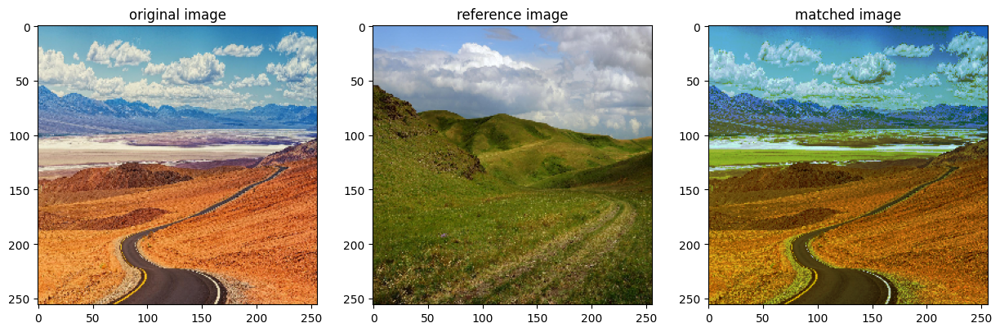

In [123]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(resized_summer)
axs[0].set_title('original image')

axs[1].imshow(resized_spring)
axs[1].set_title('reference image')

axs[2].imshow(matched_summer)
axs[2].set_title('matched image')

## Min-Max stretching:

In [124]:
def contrast_stretching(image):
	shape1, shape2, shape3 = image.shape
	
	stretched_image = np.zeros((shape1, shape2, shape3), dtype=np.uint8)
	
	R = image[:, :, 0]
	G = image[:, :, 1]
	B = image[:, :, 2]
	hist_r, hist_g, hist_b  = calculate_histogram(image)
	
	L_min = 0
	L_max = 255
	
	
	M_min_red    = np.min(image[:, :, 0])
	M_min_green  = np.min(image[:, :, 1])
	M_min_blue   = np.min(image[:, :, 2])
	
	M_max_red    = np.max(image[:, :, 0])
	M_max_green  = np.max(image[:, :, 1])
	M_max_blue   = np.max(image[:, :, 2])

	
	L_red   = (( (L_max - L_min) * (hist_r - M_min_red) )  / (M_max_red - M_min_red)) + L_min
	L_green = (( (L_max - L_min) * (hist_g - M_min_green) )  / (M_max_green - M_min_green)) + L_min
	L_blue = (( (L_max - L_min) * (hist_b - M_min_blue) )  / (M_max_blue - M_min_blue)) + L_min
	
	
	stretched_image[:, :, 0] = L_red
	stretched_image[:, :, 1] = L_green
	stretched_image[:, :, 2] = L_blue
	
	return stretched_image.astype(np.uint8)

In [125]:
def min_max_stretching(image):
	
	min_red    = np.min(image[:, :, 0])
	min_green  = np.min(image[:, :, 1])
	min_blue   = np.min(image[:, :, 2])
	
	max_red    = np.max(image[:, :, 0])
	max_green  = np.max(image[:, :, 1])
	max_blue   = np.max(image[:, :, 2])
	
	min_intensity = [min_red, min_green, min_blue]
	max_intensity = [max_red, max_green, max_blue]   
	print(min_intensity)
	print(max_intensity)     

	stretched_image = np.zeros_like(image)
	
	for i in range(3):  #for each channel (R, G, B)
		channel = image[:, :, i]
		min_channel = min_intensity[i]
		max_channel = max_intensity[i]
		stretched_channel = ((channel - min_channel) / (max_channel - min_channel)) * 255
		
		if (stretched_channel < 0).any():
			stretched_channel[stretched_channel < 0] = 0
			
		if (stretched_channel > 255).any():
			stretched_channel[stretched_channel > 255] = 255
				 
		stretched_image[:, :, i]  = stretched_channel
  
	
	return stretched_image.astype(np.uint8)

In [126]:
#stretched_summer = contrast_stretching(matched_summer)
stretched_summer = min_max_stretching(matched_summer)

[5, 0, 0]
[254, 255, 255]


In [127]:
str_summer = min_max_stretching(resized_summer)

[11, 0, 0]
[255, 247, 244]


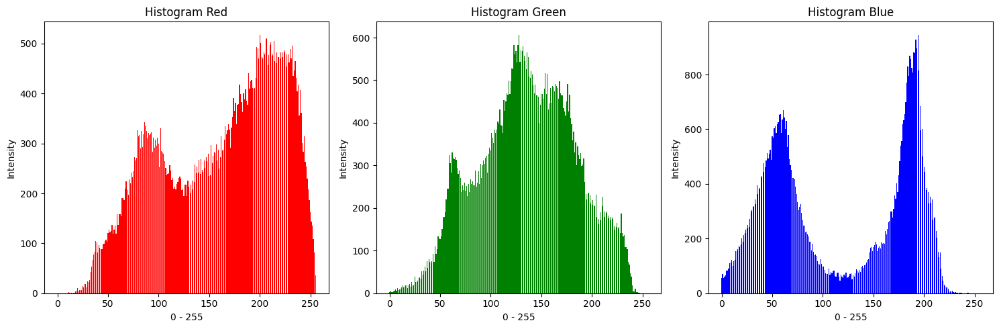

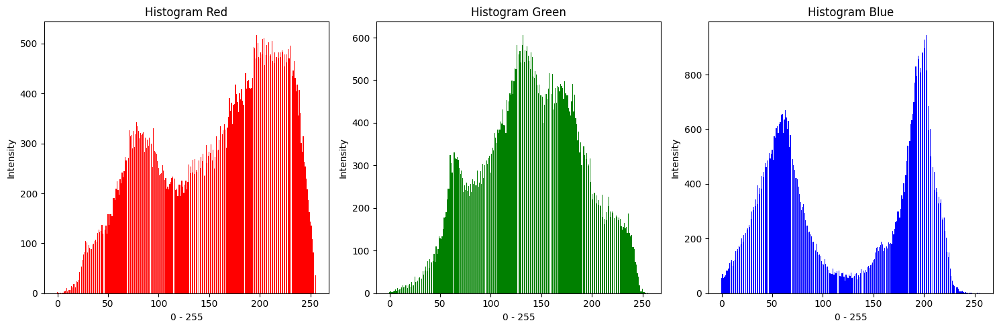

In [128]:
histogram_rgb_image(resized_summer)
histogram_rgb_image(str_summer)

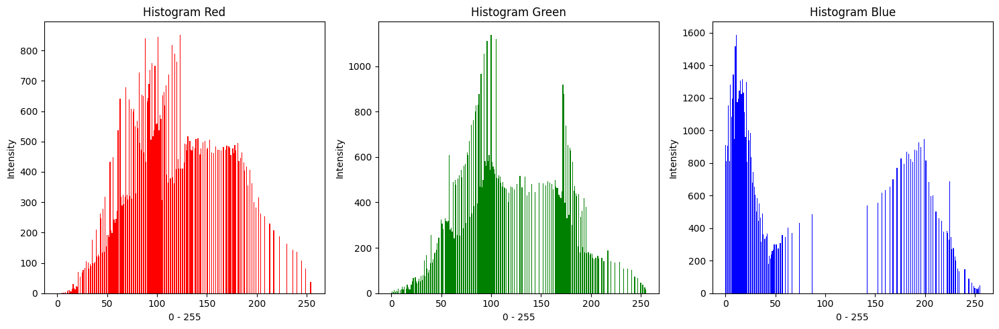

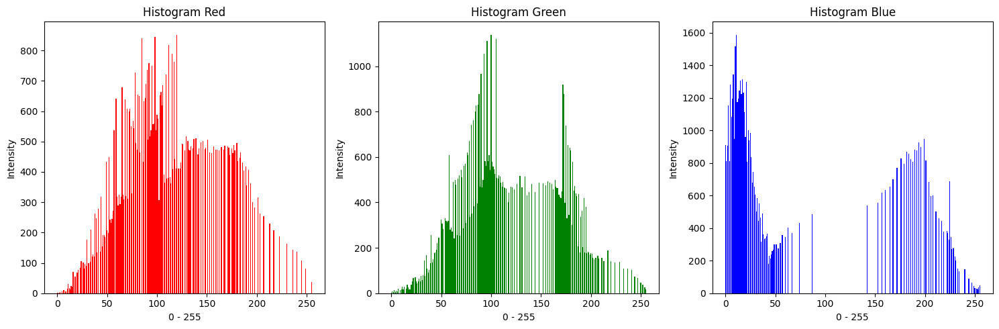

In [129]:
histogram_rgb_image(matched_summer)
histogram_rgb_image(stretched_summer)

Text(0.5, 1.0, 'stretched image')

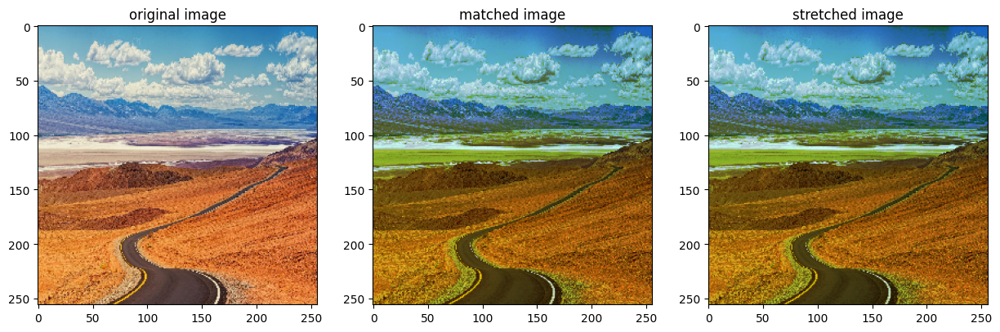

In [130]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(resized_summer)
axs[0].set_title('original image')

axs[1].imshow(matched_summer)
axs[1].set_title('matched image')

axs[2].imshow(stretched_summer)
axs[2].set_title('stretched image')

## histogram equalization:

In [ ]:
def equalize_histogram(image, all_cdf):
	cdf_r, cdf_g, cdf_b  = all_cdf
	equalized_image = image.copy()
	
	max_red   = np.max(image[:, :, 0])
	max_green = np.max(image[:, :, 1])
	max_blue  = np.max(image[:, :, 2])
	
	max_red   = 255
	max_green = 255
	max_blue  = np.max(image[:, :, 2])
	
	for row in range(image.shape[0]):
		for col in range(image.shape[1]):
			r, g, b = image[row, col]
			equalized_image[row, col] = [
				np.round(max_red   * cdf_r[r]),
				np.round(max_green * cdf_g[g]),
				np.round(max_blue  * cdf_b[b])
			]
	return equalized_image

In [ ]:
def equalization(image):
	
	hist_image = calculate_histogram(image)
	pdf_image  = calculate_pdf(hist_image)
	cdf_image = calculate_cdf(pdf_image)
	equalized_image = equalize_histogram(image, cdf_image)
	
	return equalized_image

In [131]:
equalized_stretched_summer = equalization(stretched_summer)


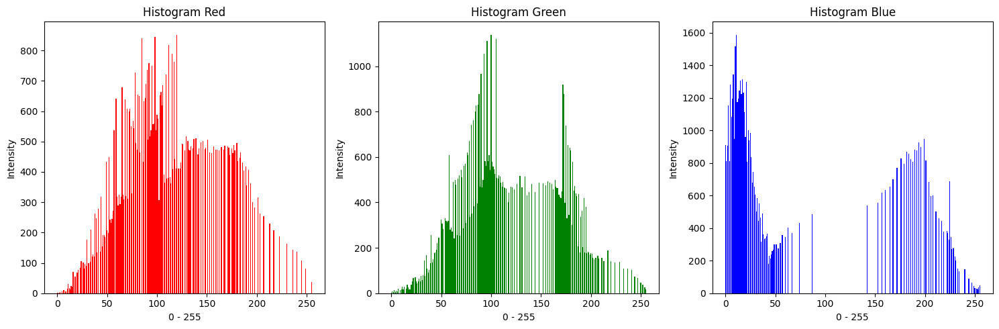

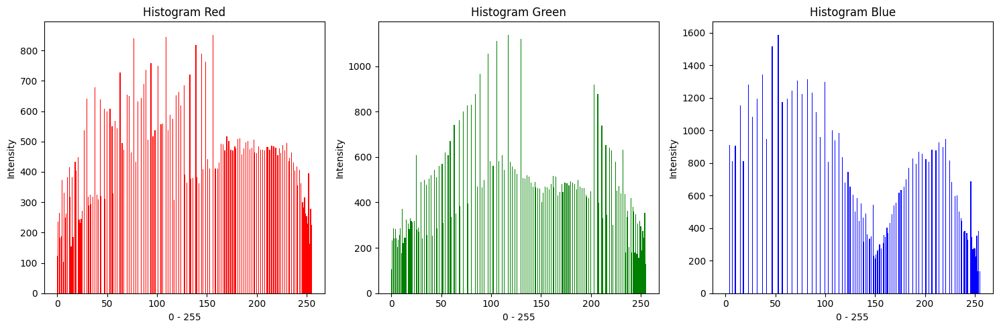

In [132]:
histogram_rgb_image(stretched_summer)
histogram_rgb_image(equalized_stretched_summer)

Text(0.5, 1.0, 'equalized stretched image')

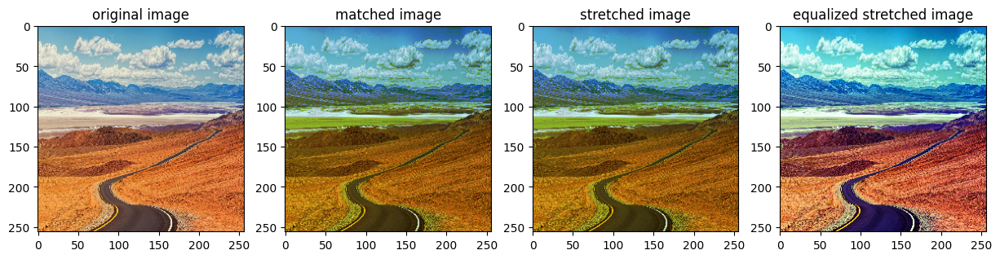

In [133]:
fig, axs = plt.subplots(1, 4, figsize=(15, 5))

axs[0].imshow(resized_summer)
axs[0].set_title('original image')

axs[1].imshow(matched_summer)
axs[1].set_title('matched image')

axs[2].imshow(stretched_summer)
axs[2].set_title('stretched image')

axs[3].imshow(equalized_stretched_summer)
axs[3].set_title('equalized stretched image')

## CLAHE:

In [134]:
'''
def CLAHE(image):
	clahe = cv2.createCLAHE(clipLimit = 3.0, tileGridSize=(8,8))
	#clahe_image = np.zeroes_like(image)

	R   = image[:, :, 0]
	G   = image[:, :, 1]
	B   = image[:, :, 2]

	R_clahe = clahe.apply(R)
	G_clahe = clahe.apply(G)
	B_clahe = clahe.apply(B)

	clahe_image = cv2.merge((R_clahe, G_clahe, B_clahe))
	return clahe_image
'''

In [193]:
def calculate_CLAHE(image):
	
	clahe = cv2.createCLAHE(clipLimit= 2, tileGridSize=(8, 8))

	lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

	L, A, B = cv2.split(lab_image)

	L_clahe = clahe.apply(L)

	clahe_image_lab = cv2.merge((L_clahe, A, B))

	clahe_image = cv2.cvtColor(clahe_image_lab, cv2.COLOR_LAB2BGR)

	return clahe_image

In [194]:
clahe_summer = calculate_CLAHE(resized_summer)

clahe_body   = calculate_CLAHE(resized_body)
clahe_blur   = calculate_CLAHE(resized_blur)

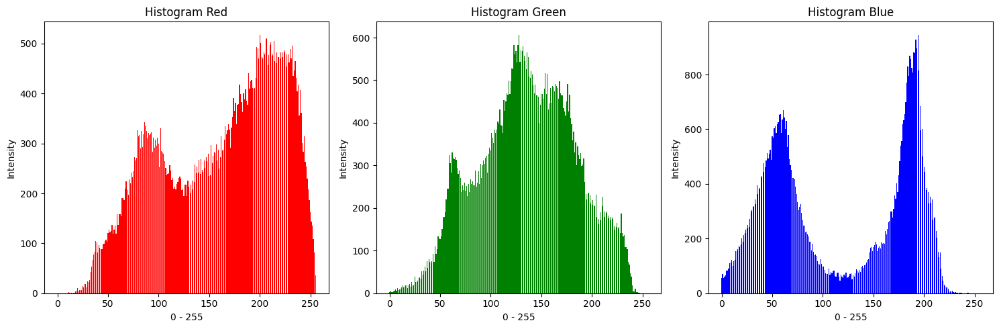

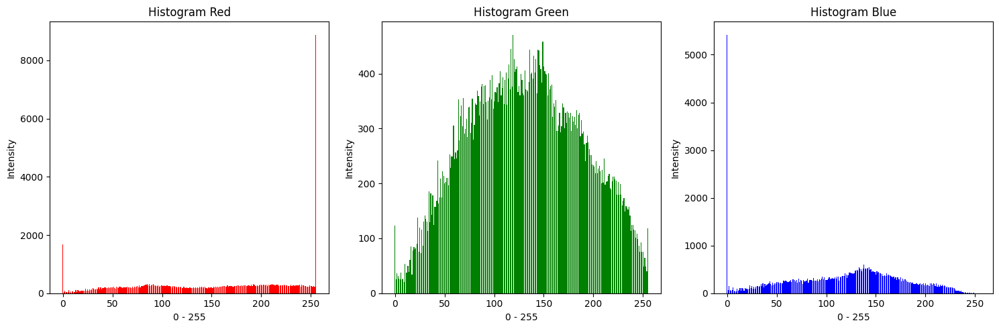

In [195]:
histogram_rgb_image(resized_summer)
histogram_rgb_image(clahe_summer)

Text(0.5, 1.0, 'CLAHE image')

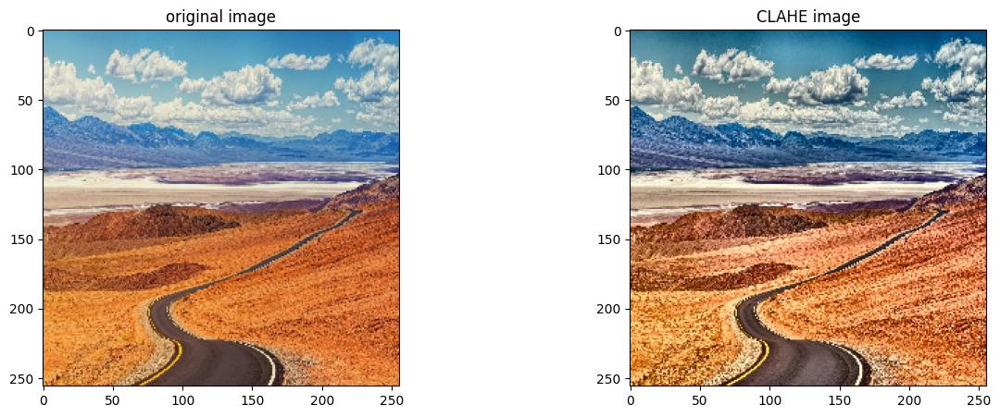

In [196]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(resized_summer)
axs[0].set_title('original image')

axs[1].imshow(clahe_summer)
axs[1].set_title('CLAHE image')

Text(0.5, 1.0, 'CLAHE image')

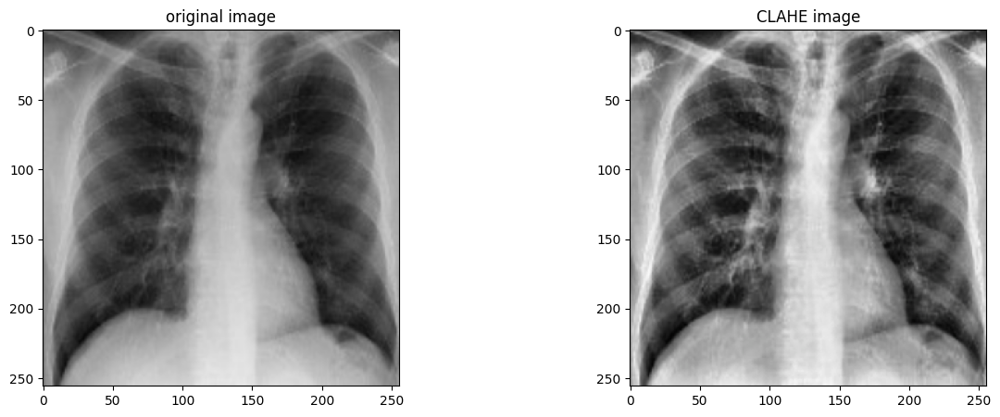

In [197]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(resized_body)
axs[0].set_title('original image')

axs[1].imshow(clahe_body)
axs[1].set_title('CLAHE image')

## clahe from scratch:

In [206]:
def scratch_CLAHE(image, grid_size=(8, 8), clip_limit= 2):
    num_grid_x = image.shape[1] // grid_size[1]
    num_grid_y = image.shape[0] // grid_size[0]

    clahe_image = np.zeros_like(image)

    # Apply CLAHE to each tile
    for y in range(num_grid_y):
        for x in range(num_grid_x):

            grid = image[y * grid_size[0] : (y + 1) * grid_size[0],
                         x * grid_size[1] : (x + 1) * grid_size[1]]

            all_hist = calculate_histogram(grid)
            all_pdf  = calculate_pdf(all_hist)
            all_cdf  = calculate_cdf(all_pdf)
            
            # Clip and scale the CDF for each color channel
            clipped_cdf = [np.minimum(cdf, clip_limit) for cdf in all_cdf]
            scaled_cdf = [(cdf - cdf.min()) / (1 - cdf.min()) for cdf in clipped_cdf]

            # Map the tile intensities using the scaled CDF
            mapped_grid = [(grid[:,:,i] - grid[:,:,i].min()) * scaled_cdf[i][grid[:,:,i]] + grid[:,:,i].min() for i in range(3)]

            for i in range(3):
                clahe_image[y * grid_size[0] : (y + 1) * grid_size[0], x * grid_size[1] : (x + 1) * grid_size[1], i] = mapped_grid[i]

    clahe_image[clahe_image > 255] = 255
    clahe_image[clahe_image < 0]   = 0

    return clahe_image.astype(np.uint8)


In [199]:
scratch_clahe_summer = scratch_CLAHE(resized_summer, grid_size=(8, 8))

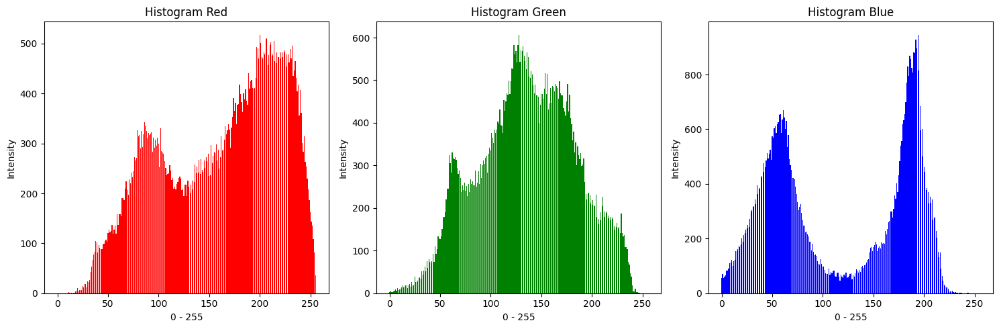

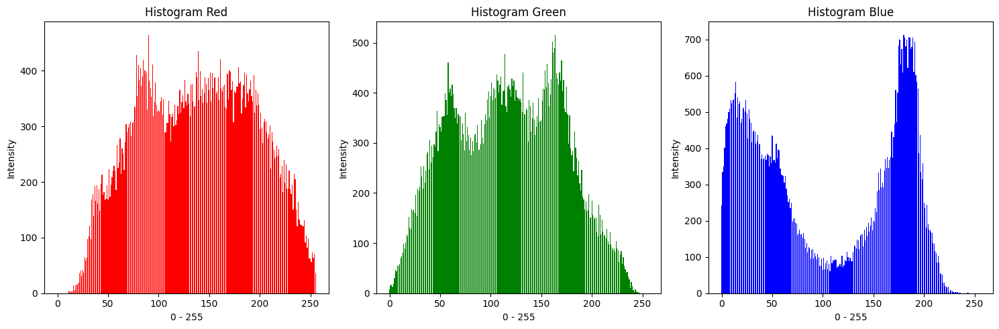

In [200]:
histogram_rgb_image(resized_summer)
histogram_rgb_image(scratch_clahe_summer)

Text(0.5, 1.0, 'CLAHE from scratch image')

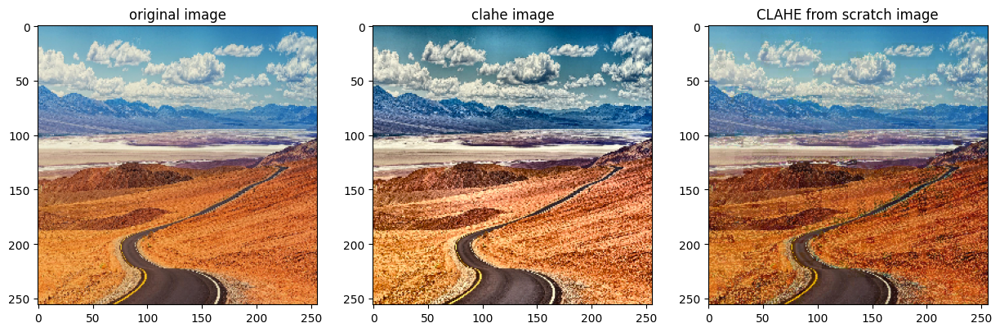

In [205]:

fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(resized_summer)
axs[0].set_title('original image')

axs[1].imshow(clahe_summer)
axs[1].set_title('clahe image')

axs[2].imshow(scratch_clahe_summer)
axs[2].set_title('CLAHE from scratch image')



Text(0.5, 1.0, 'CLAHE from scratch image')

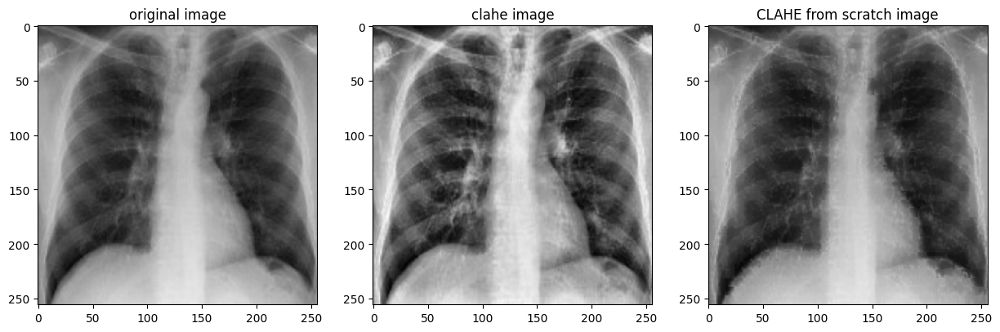

In [202]:
scratch_clahe_body = scratch_CLAHE(resized_body, grid_size=(8, 8))
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(resized_body)
axs[0].set_title('original image')

axs[1].imshow(clahe_body)
axs[1].set_title('clahe image')

axs[2].imshow(scratch_clahe_body )
axs[2].set_title('CLAHE from scratch image')

Text(0.5, 1.0, 'CLAHE from scratch image')

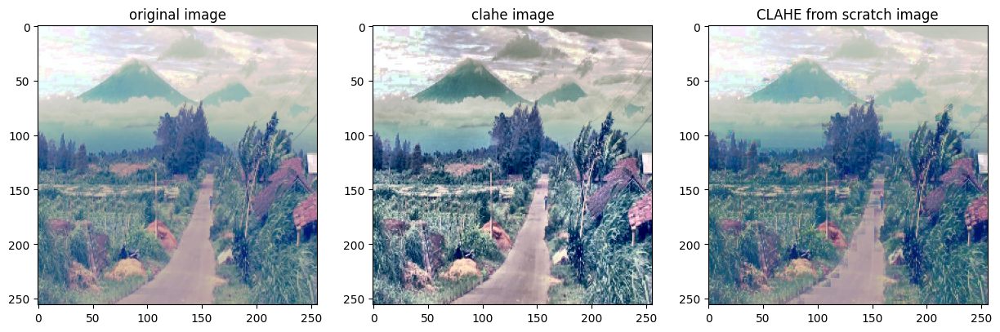

In [203]:
scratch_clahe_blur = scratch_CLAHE(resized_blur, grid_size=(8, 8))
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(resized_blur)
axs[0].set_title('original image')

axs[1].imshow(clahe_blur)
axs[1].set_title('clahe image')

axs[2].imshow(scratch_clahe_blur)
axs[2].set_title('CLAHE from scratch image')

## Repeat steps 4 to 7 for “blur.jpg

In [146]:
reference_histogram = calculate_histogram(resized_spring)
matched_blur = histogram_matching(resized_blur, reference_histogram)

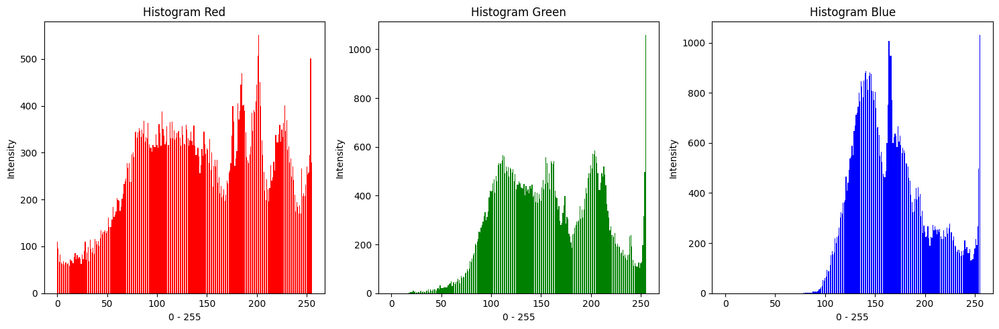

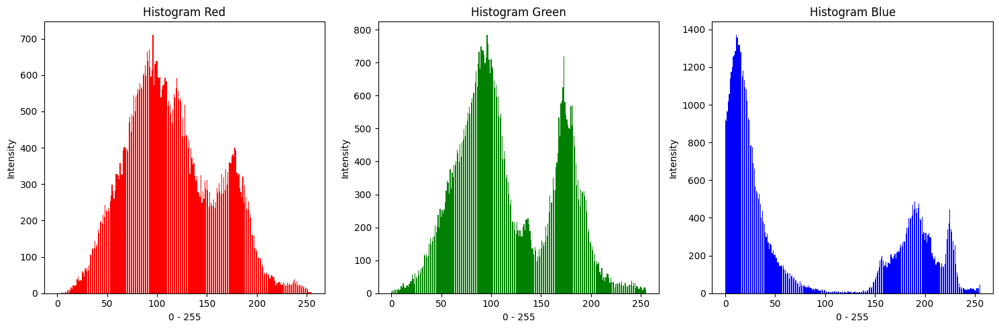

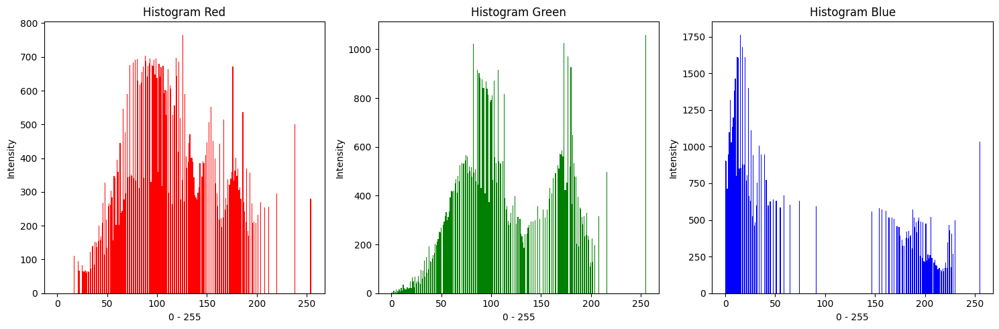

In [147]:
histogram_rgb_image(resized_blur)
histogram_rgb_image(resized_spring)
histogram_rgb_image(matched_blur)

Text(0.5, 1.0, 'matched image')

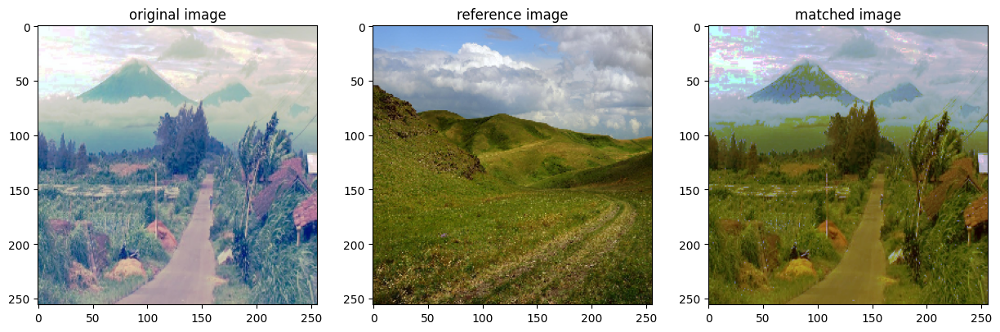

In [148]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(resized_blur)
axs[0].set_title('original image')

axs[1].imshow(resized_spring)
axs[1].set_title('reference image')

axs[2].imshow(matched_blur)
axs[2].set_title('matched image')

[17, 0, 0]
[254, 255, 255]


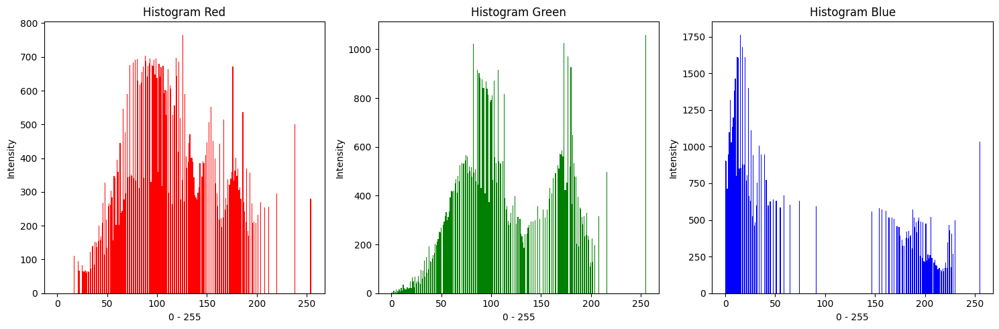

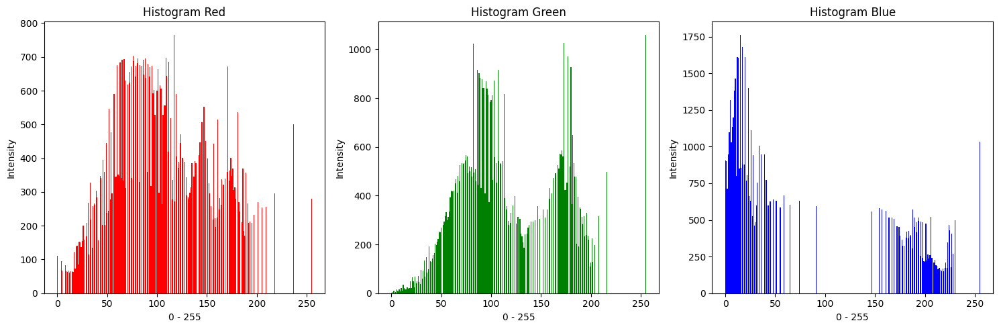

In [149]:
stretched_blur = min_max_stretching(matched_blur)

histogram_rgb_image(matched_blur)
histogram_rgb_image(stretched_blur)

Text(0.5, 1.0, 'stretched image')

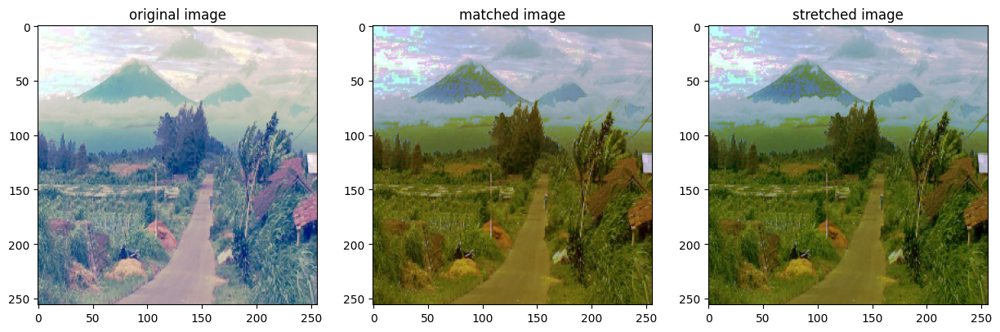

In [150]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(resized_blur)
axs[0].set_title('original image')

axs[1].imshow(matched_blur)
axs[1].set_title('matched image')

axs[2].imshow(stretched_blur)
axs[2].set_title('stretched image')

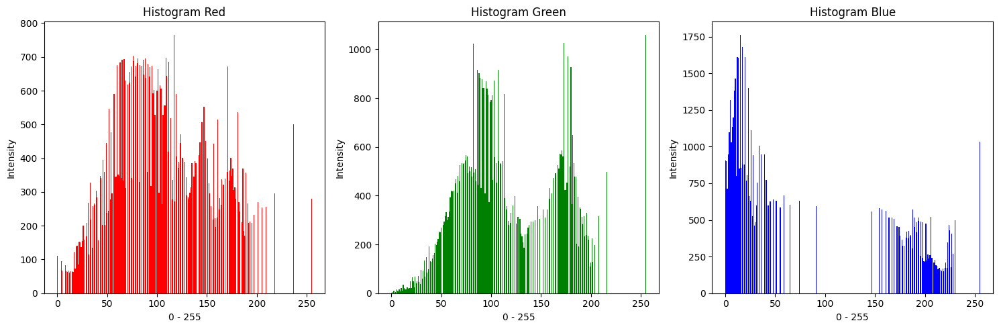

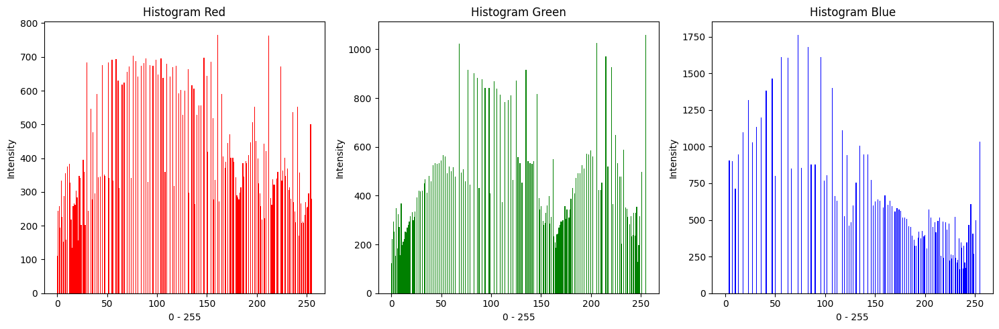

In [151]:
equalized_stretched_blur = equalization(stretched_blur)

histogram_rgb_image(stretched_blur)
histogram_rgb_image(equalized_stretched_blur)

Text(0.5, 1.0, 'equalized stretched image')

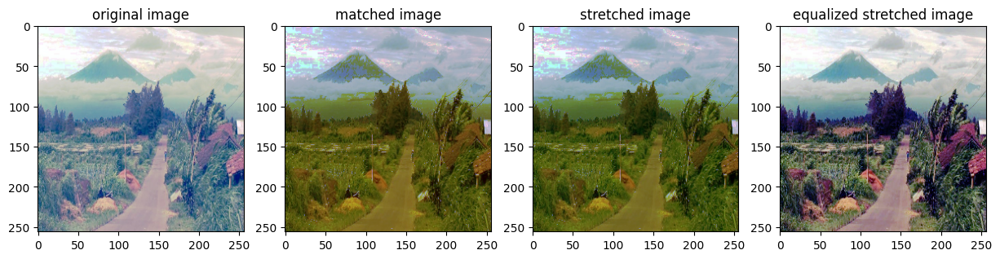

In [152]:
fig, axs = plt.subplots(1, 4, figsize=(15, 5))

axs[0].imshow(resized_blur)
axs[0].set_title('original image')

axs[1].imshow(matched_blur)
axs[1].set_title('matched image')

axs[2].imshow(stretched_blur)
axs[2].set_title('stretched image')

axs[3].imshow(equalized_stretched_blur)
axs[3].set_title('equalized stretched image')

Text(0.5, 1.0, 'CLAHE from scratch image')

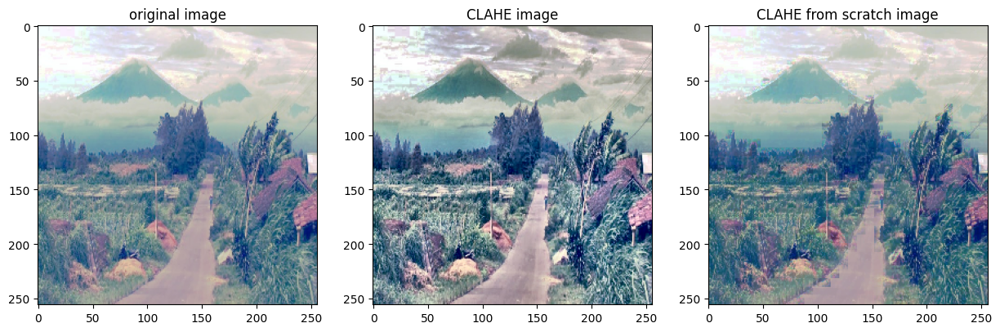

In [208]:
clahe_blur = calculate_CLAHE(resized_blur)
scratch_clahe_blur = scratch_CLAHE(resized_blur)

fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(resized_blur)
axs[0].set_title('original image')

axs[1].imshow(clahe_blur)
axs[1].set_title('CLAHE image')

axs[2].imshow(scratch_clahe_blur)
axs[2].set_title('CLAHE from scratch image')

## Report PSNR and MSE criteria

In [154]:
def PSNR(image, compared):
	mse = np.mean((image - compared) ** 2)
	if mse == 0:
		psnr = np.INF  # Maximum PSNR when MSE is 0
	else:
		max_pixel = 255.0
		#psnr = 20 * np.log10(max_pixel / np.sqrt(mse))   
		psnr = 10 * np.log10(max_pixel**2 / mse)    
	return psnr, mse

In [155]:
psnr_summer , mse_summer = PSNR(resized_summer, matched_summer)
print(f"PSNR summer and matched summer = {psnr_summer}")
print(f"MSE summer and matched summer  = {mse_summer}")

print("\n")

psnr_summer, mse_summer = PSNR(matched_summer, stretched_summer)
print(f"PSNR matched summer and stretched summer = {psnr_summer}")
print(f"MSE matched summer and stretched summer  = {mse_summer}")

print("\n")

psnr_summer, mse_summer = PSNR(stretched_summer, equalized_stretched_summer)
print(f"PSNR stretched_summer and equalized_stretched_summer = {psnr_summer}")
print(f"MSE stretched_summer and equalized_stretched_summer  = {mse_summer}")

print("\n")

psnr_summer, mse_summer = PSNR(resized_summer, equalized_stretched_summer)
print(f"PSNR resized_summer and equalized_stretched_summer = {psnr_summer}")
print(f"MSE resized_summer and equalized_stretched_summer  = {mse_summer}")

print("\n")

psnr_summer, mse_summer = PSNR(resized_summer, clahe_summer)
print(f"PSNR resized_summer and clahe_summer = {psnr_summer}")
print(f"MSE resized_summer and clahe_summer  = {mse_summer}")

PSNR summer and matched summer = 28.098139078573602
MSE summer and matched summer  = 100.75496419270833


PSNR matched summer and stretched summer = 43.2592871758715
MSE matched summer and stretched summer  = 3.070093790690104


PSNR stretched_summer and equalized_stretched_summer = 27.6560142782682
MSE stretched_summer and equalized_stretched_summer  = 111.55240376790364


PSNR resized_summer and equalized_stretched_summer = 28.087278881300477
MSE resized_summer and equalized_stretched_summer  = 101.00723266601562


PSNR resized_summer and clahe_summer = 27.98544765716562
MSE resized_summer and clahe_summer  = 103.40358479817708


In [156]:
psnr_blur , mse_blur = PSNR(resized_blur, matched_blur)
print(f"PSNR summer and matched blur = {psnr_blur}")
print(f"MSE summer and matched blur  = {mse_blur}")

print("\n")

psnr_blur, mse_blur = PSNR(matched_blur, stretched_blur)
print(f"PSNR matched summer and stretched blur = {psnr_blur}")
print(f"MSE matched summer and stretched blur  = {mse_blur}")

print("\n")

psnr_blur, mse_blur = PSNR(stretched_blur, equalized_stretched_blur)
print(f"PSNR stretched blur and equalized_stretched blur = {psnr_blur}")
print(f"MSE stretched blur and equalized_stretched blur  = {mse_blur}")

print("\n")

psnr_summer, mse_summer = PSNR(resized_blur, equalized_stretched_blur)
print(f"PSNR resized blur and equalized_stretched blur = {psnr_blur}")
print(f"MSE resized blur and equalized_stretched blur  = {mse_blur}")

print("\n")

psnr_blur, mse_blur = PSNR(resized_blur, clahe_blur)
print(f"PSNR resized blur and clahe blur = {psnr_blur}")
print(f"MSE resized blur and clahe blur  = {mse_blur}")

PSNR summer and matched blur = 28.308105774449874
MSE summer and matched blur  = 95.99967956542969


PSNR matched summer and stretched blur = 32.81652577206416
MSE matched summer and stretched blur  = 33.9959971110026


PSNR stretched blur and equalized_stretched blur = 27.805060760850004
MSE stretched blur and equalized_stretched blur  = 107.78896077473958


PSNR resized blur and equalized_stretched blur = 27.805060760850004
MSE resized blur and equalized_stretched blur  = 107.78896077473958


PSNR resized blur and clahe blur = 28.2591110902113
MSE resized blur and clahe blur  = 97.08882649739583


## Perform an Idea to enhance the “body.jpg”

In [157]:
clahe_body   = calculate_CLAHE(resized_body)

Text(0.5, 1.0, 'CLAHE image')

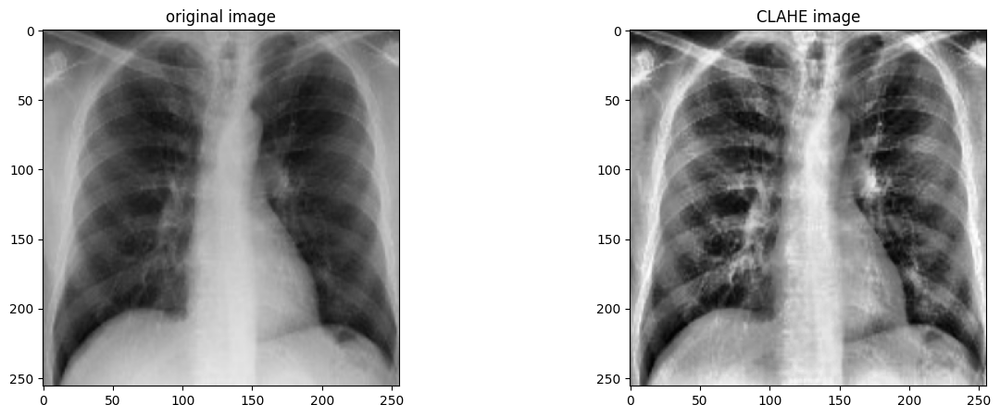

In [158]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(resized_body)
axs[0].set_title('original image')

axs[1].imshow(clahe_body)
axs[1].set_title('CLAHE image')

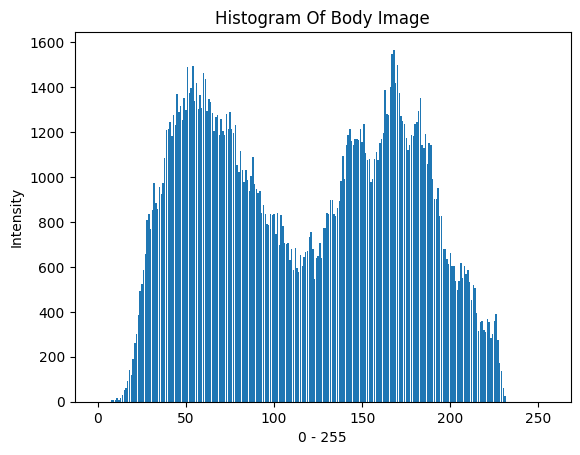

In [159]:
count = np.zeros(256)

for b in resized_body:
	for i in range(len(b)):
		for j in range(len(b[i])):
			 count[b[i][j] - 1] += 1

plt.bar(np.arange(256), count)
plt.xlabel('0 - 255')
plt.ylabel('Intensity')
plt.title('Histogram Of Body Image')
plt.show()

In [160]:
stretched_body = min_max_stretching(resized_body)

[9, 9, 9]
[232, 232, 232]


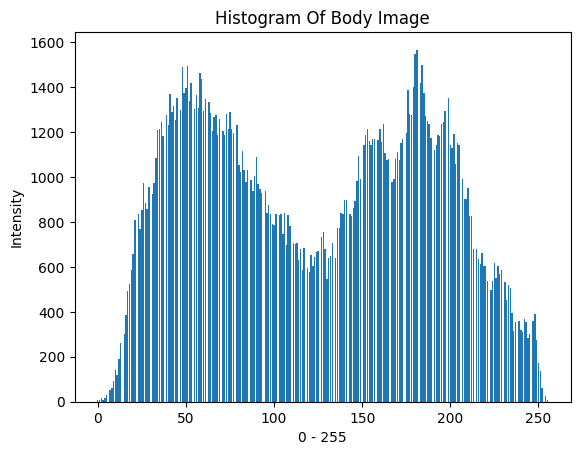

In [161]:
count = np.zeros(256)

for b in stretched_body:
	for i in range(len(b)):
		for j in range(len(b[i])):
			 count[b[i][j] - 1] += 1

plt.bar(np.arange(256), count)
plt.xlabel('0 - 255')
plt.ylabel('Intensity')
plt.title('Histogram Of Body Image')
plt.show()

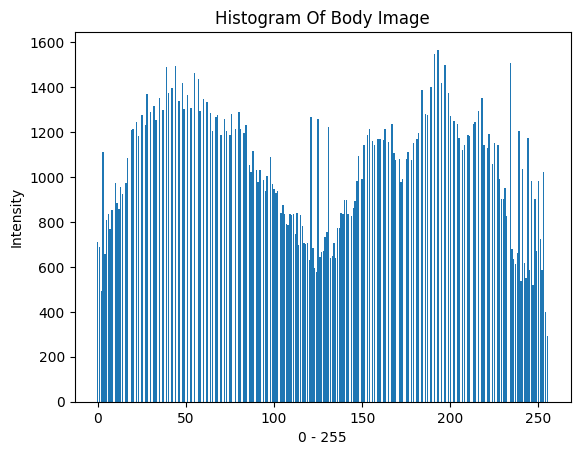

In [162]:
equalized_body = equalization(stretched_body)

count = np.zeros(256)

for b in equalized_body:
	for i in range(len(b)):
		for j in range(len(b[i])):
			 count[b[i][j] - 1] += 1

plt.bar(np.arange(256), count)
plt.xlabel('0 - 255')
plt.ylabel('Intensity')
plt.title('Histogram Of Body Image')
plt.show()

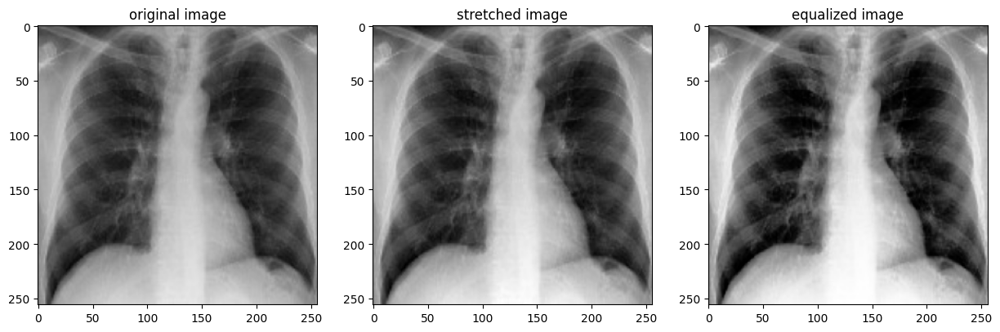

In [163]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(resized_body)
axs[0].set_title('original image')

axs[1].imshow(stretched_body)
axs[1].set_title('stretched image')

axs[2].imshow(equalized_body)
axs[2].set_title('equalized image')


plt.show()

Text(0.5, 1.0, 'CLAHE from scratch image')

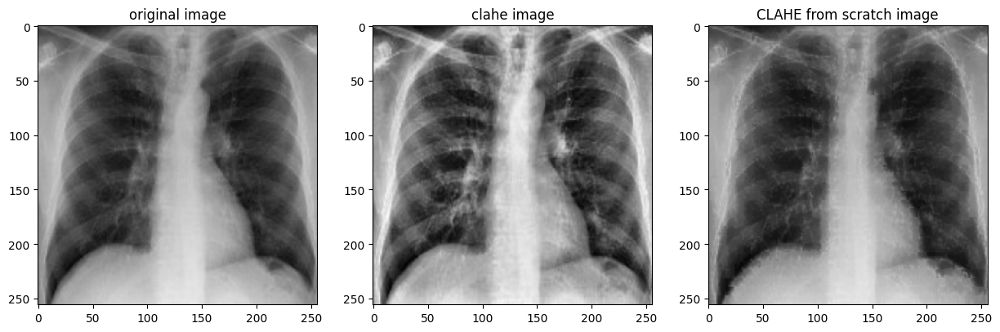

In [209]:
scratch_clahe_body = scratch_CLAHE(resized_body, grid_size=(8, 8))
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(resized_body)
axs[0].set_title('original image')

axs[1].imshow(clahe_body)
axs[1].set_title('clahe image')

axs[2].imshow(scratch_clahe_body )
axs[2].set_title('CLAHE from scratch image')

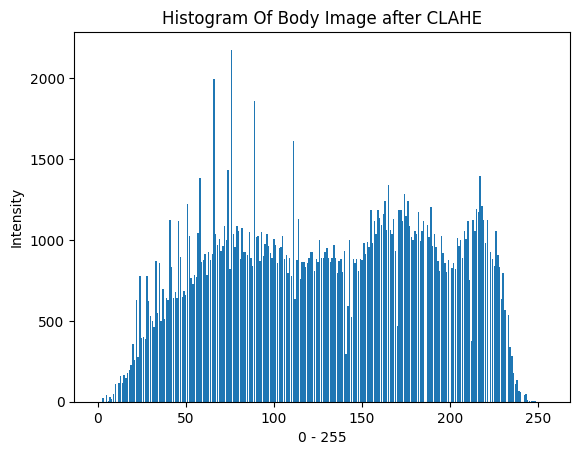

In [211]:
count = np.zeros(256)

for b in clahe_body:
	for i in range(len(b)):
		for j in range(len(b[i])):
			 count[b[i][j] - 1] += 1

plt.bar(np.arange(256), count)
plt.xlabel('0 - 255')
plt.ylabel('Intensity')
plt.title('Histogram Of Body Image after CLAHE')
plt.show()

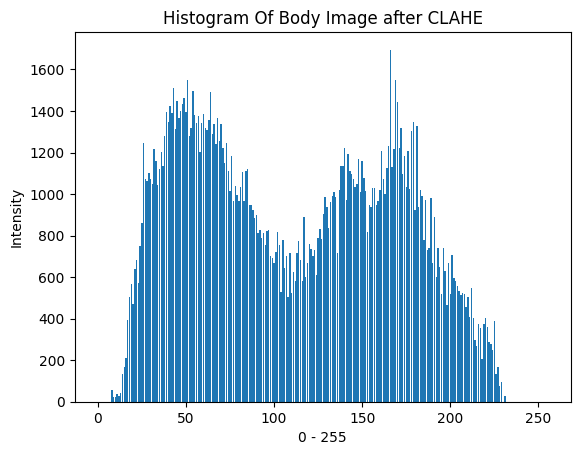

In [212]:
count = np.zeros(256)

for b in scratch_clahe_body:
	for i in range(len(b)):
		for j in range(len(b[i])):
			 count[b[i][j] - 1] += 1

plt.bar(np.arange(256), count)
plt.xlabel('0 - 255')
plt.ylabel('Intensity')
plt.title('Histogram Of Body Image after CLAHE')
plt.show()